In [ ]:
pip install vame-py

Note: you may need to restart the kernel to use updated packages.


In [ ]:

import pprint
from vame.pipeline import VAMEPipeline
from vame.util.sample_data import download_sample_data
import vame
from vame.util.sample_data import download_sample_data
from pathlib import Path

2026-02-15 14:40:30.198 INFO  --- [MainThread] numexpr.utils   : 164 : NumExpr defaulting to 12 threads.
2026-02-15 14:40:35.359 INFO  --- [MainThread] vame.model.rnn_vae : 31 : GPU detected
2026-02-15 14:40:35.363 INFO  --- [MainThread] vame.model.rnn_vae : 32 : GPU used: NVIDIA GeForce RTX 5060 Ti
2026-02-15 14:40:37.352 | WARNING  | tqdm.autonotebook:<module>:19 - c:\Users\zuria\miniconda3\envs\vame_research\Lib\site-packages\tqdm\auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm



In [3]:
# You can run VAME with data from different sources:
# "DeepLabCut", "SLEAP" or "LightningPose"
source_software = "DeepLabCut"

# Download sample data
sample = download_sample_data(source_software)
videos = [sample["video"]]
poses_estimations = [sample["poses"]]
fps = sample["fps"]

print(videos)
print(poses_estimations)
print(fps)

SHA256 hash of downloaded file: c6ee9deadaa2e8fba9d1d11f3432cf67007cd7a9798b1683769ada1619d9d2ab
Use this value as the 'known_hash' argument of 'pooch.retrieve' to ensure that the file hasn't changed if it is downloaded again in the future.
0.00B [00:00, ?B/s]     
100%|#############################################| 48.1M/48.1M [00:00<?, ?B/s]
0.00B [00:00, ?B/s]     

['C:\\Users\\zuria\\.movement\\data\\videos\\DLC_single-mouse_EPM.predictions.mp4']
['C:\\Users\\zuria\\.movement\\data\\poses\\DLC_single-mouse_EPM.predictions.csv']
30


# Step 1

In [4]:
config_file, config_data = vame.init_new_project(
    project_name="my_vame_project",
    poses_estimations=poses_estimations,
    source_software="DeepLabCut",
    fps=fps,
)

2026-02-15 14:41:07.441 INFO  --- [MainThread] vame.initialize_project.new : 109 : Created "C:\Users\zuria\Kaplan\VameTest\my_vame_project\data"
2026-02-15 14:41:07.442 INFO  --- [MainThread] vame.initialize_project.new : 109 : Created "C:\Users\zuria\Kaplan\VameTest\my_vame_project\data\raw"
2026-02-15 14:41:07.442 INFO  --- [MainThread] vame.initialize_project.new : 109 : Created "C:\Users\zuria\Kaplan\VameTest\my_vame_project\data\processed"
2026-02-15 14:41:07.443 INFO  --- [MainThread] vame.initialize_project.new : 109 : Created "C:\Users\zuria\Kaplan\VameTest\my_vame_project\results"
2026-02-15 14:41:07.444 INFO  --- [MainThread] vame.initialize_project.new : 109 : Created "C:\Users\zuria\Kaplan\VameTest\my_vame_project\model"
2026-02-15 14:41:07.445 INFO  --- [MainThread] vame.initialize_project.new : 109 : Created "C:\Users\zuria\Kaplan\VameTest\my_vame_project\model\pretrained_model"
2026-02-15 14:41:07.446 INFO  --- [MainThread] vame.initialize_project.new : 109 : Created "C:

In [5]:
print(config_data)

{'vame_version': '0.12.0', 'project_name': 'my_vame_project', 'project_path': 'C:\\Users\\zuria\\Kaplan\\VameTest\\my_vame_project', 'creation_datetime': '2026-02-15T22:41:07+00:00', 'session_names': ['DLC_single-mouse_EPM.predictions'], 'project_random_state': 42, 'all_data': 'yes', 'keypoints': ['snout', 'left_ear', 'right_ear', 'centre', 'lateral_left', 'lateral_right', 'tailbase', 'tail_end'], 'egocentric_data': False, 'pose_confidence': 0.99, 'robust': True, 'iqr_factor': 4, 'savgol_filter': True, 'savgol_length': 5, 'savgol_order': 2, 'test_fraction': 0.1, 'model_name': 'VAME', 'pretrained_model': 'None', 'pretrained_weights': False, 'num_features': 16, 'batch_size': 256, 'max_epochs': 500, 'model_snapshot': 50, 'model_convergence': 50, 'transition_function': 'GRU', 'beta': 1, 'beta_norm': False, 'zdims': 30, 'learning_rate': 0.0005, 'time_window': 30, 'prediction_decoder': 1, 'prediction_steps': 15, 'noise': False, 'scheduler': 1, 'scheduler_step_size': 100, 'scheduler_gamma': 0

In [6]:
ds_path = Path(config_data["project_path"]) / "data" / "raw" / f"{config_data['session_names'][0]}.nc"
vame.io.load_poses.load_vame_dataset(ds_path)

<xarray.Dataset> Size: 4MB
Dimensions:      (time: 18485, space: 2, keypoints: 8, individuals: 1)
Coordinates:
  * time         (time) float64 148kB 0.0 0.03333 0.06667 ... 616.1 616.1 616.1
  * space        (space) <U1 8B 'x' 'y'
  * keypoints    (keypoints) <U13 416B 'snout' 'left_ear' ... 'tail_end'
  * individuals  (individuals) <U12 48B 'individual_0'
Data variables:
    position     (time, space, keypoints, individuals) float64 2MB 508.4 ... ...
    confidence   (time, keypoints, individuals) float64 1MB 0.0002829 ... 0.9978
Attributes:
    source_software:  DeepLabCut
    ds_type:          poses
    fps:              30.0
    time_unit:        seconds
    source_file:      C:/Users/zuria/.movement/data/poses/DLC_single-mouse_EP...

In [7]:
vame.preprocessing(
    config=config_data,
    centered_reference_keypoint="snout",
    orientation_reference_keypoint="tailbase",
)

2026-02-15 14:42:01.799 INFO  --- [MainThread] vame.preprocessing.preprocessing : 67 : Cleaning low confidence data points...
2026-02-15 14:42:01.801 INFO  --- [MainThread] vame.preprocessing.cleaning : 46 : Cleaning low confidence data points. Confidence threshold: 0.99
2026-02-15 14:42:01.802 INFO  --- [MainThread] vame.preprocessing.cleaning : 49 : Session: DLC_single-mouse_EPM.predictions
2026-02-15 14:42:01.939 INFO  --- [MainThread] vame.preprocessing.preprocessing : 78 : Egocentrically aligning and centering...
2026-02-15 14:42:01.941 INFO  --- [MainThread] vame.preprocessing.alignment : 78 : Egocentric alignment with references: snout and tailbase
2026-02-15 14:42:01.942 INFO  --- [MainThread] vame.preprocessing.alignment : 85 : Session: DLC_single-mouse_EPM.predictions
2026-02-15 14:42:02.328 INFO  --- [MainThread] vame.preprocessing.preprocessing : 91 : Cleaning outliers using IQR method...
2026-02-15 14:42:02.330 INFO  --- [MainThread] vame.preprocessing.cleaning : 130 : Cle

'position_processed'

In [8]:
vame.create_trainset(
    config=config_data,
    keypoints_to_exclude=["tail_end"],
)

2026-02-15 14:42:08.599 INFO  --- [MainThread] vame.model.create_training : 320 : Creating training dataset...
2026-02-15 14:42:08.761 INFO  --- [MainThread] vame.model.create_training : 187 : Session DLC_single-mouse_EPM.predictions: test chunk 15795:17643 (length 1848)
2026-02-15 14:42:08.765 INFO  --- [MainThread] vame.model.create_training : 240 : Metadata file saved for feature provenance tracking
2026-02-15 14:42:08.765 INFO  --- [MainThread] vame.model.create_training : 241 : Metadata: C:\Users\zuria\Kaplan\VameTest\my_vame_project\data\train\metadata.json
2026-02-15 14:42:08.766 INFO  --- [MainThread] vame.model.create_training : 243 : Length of train data: 16637
2026-02-15 14:42:08.767 INFO  --- [MainThread] vame.model.create_training : 244 : Length of test data: 1848
2026-02-15 14:42:08.767 INFO  --- [MainThread] vame.model.create_training : 245 : Number of features: 11
2026-02-15 14:42:08.804 INFO  --- [MainThread] vame.model.create_training : 335 : A training and test set h

In [9]:
vame.train_model(config=config_data)

2026-02-15 14:42:13.724 INFO  --- [MainThread] vame.model.rnn_vae : 572 : Train Variational Autoencoder - model name: VAME 

2026-02-15 14:42:13.730 INFO  --- [MainThread] vame.model.rnn_vae : 588 : TensorBoard logging enabled. Log directory: C:\Users\zuria\Kaplan\VameTest\my_vame_project\logs\tensorboard\VAME
2026-02-15 14:42:13.731 INFO  --- [MainThread] vame.model.rnn_vae : 589 : To view logs, run: tensorboard --logdir=C:\Users\zuria\Kaplan\VameTest\my_vame_project\logs\tensorboard --port=6006
2026-02-15 14:42:13.731 INFO  --- [MainThread] vame.model.rnn_vae : 594 : Using CUDA
2026-02-15 14:42:13.732 INFO  --- [MainThread] vame.model.rnn_vae : 595 : GPU active: True
2026-02-15 14:42:13.733 INFO  --- [MainThread] vame.model.rnn_vae : 596 : GPU used: NVIDIA GeForce RTX 5060 Ti
2026-02-15 14:42:13.733 INFO  --- [MainThread] vame.model.rnn_vae : 641 : Latent Dimensions: 30, Time window: 30, Batch Size: 256, Beta: 1, lr: 0.0005

2026-02-15 14:42:14.942 INFO  --- [MainThread] vame.model.r

In [10]:
vame.evaluate_model(config=config_data)

2026-02-15 15:04:10.949 INFO  --- [MainThread] vame.model.evaluate : 314 : Using CUDA
2026-02-15 15:04:10.950 INFO  --- [MainThread] vame.model.evaluate : 315 : GPU active: True
2026-02-15 15:04:10.950 INFO  --- [MainThread] vame.model.evaluate : 316 : GPU used: NVIDIA GeForce RTX 5060 Ti
2026-02-15 15:04:10.951 INFO  --- [MainThread] vame.model.evaluate : 321 : Evaluation of model: VAME
2026-02-15 15:04:11.10 INFO  --- [MainThread] vame.model.evaluate : 64 : Initialize test data. Datapoints 1848
2026-02-15 15:04:11.393 INFO  --- [MainThread] vame.model.evaluate : 343 : Evaluation finished successfully! You can find the results in: 'C:\Users\zuria\Kaplan\VameTest\my_vame_project/model/evaluate/'
2026-02-15 15:04:11.394 INFO  --- [MainThread] vame.model.evaluate : 344 : Next steps:
            - vame.segment_session() to identify behavioral motifs.
            - re-run the model for further fine tuning. Check again with vame.evaluate_model()


In [11]:
vame.segment_session(
    config=config_data,
    overwrite_segmentation=False,
    overwrite_embeddings=False,
)

2026-02-15 15:04:37.472 INFO  --- [MainThread] vame.analysis.pose_segmentation : 172 : ---------------------------------------------------------------------
2026-02-15 15:04:37.473 INFO  --- [MainThread] vame.analysis.pose_segmentation : 173 : Embedding latent vectors for VAME model (OPTIMIZED)
2026-02-15 15:04:37.485 INFO  --- [MainThread] vame.util.model_util : 56 : Loaded training metadata with 7 keypoints
2026-02-15 15:04:37.486 INFO  --- [MainThread] vame.util.model_util : 57 : Keypoints used during training: ['snout', 'left_ear', 'right_ear', 'centre', 'lateral_left', 'lateral_right', 'tailbase']
2026-02-15 15:04:37.487 INFO  --- [MainThread] vame.analysis.pose_segmentation : 197 : Embedding of latent vector for file DLC_single-mouse_EPM.predictions
2026-02-15 15:04:37.488 INFO  --- [MainThread] vame.util.auxiliary : 35 : Using CUDA
2026-02-15 15:04:37.488 INFO  --- [MainThread] vame.util.auxiliary : 36 : GPU active: True
2026-02-15 15:04:37.489 INFO  --- [MainThread] vame.util.a

In [12]:
vame.community(
    config=config_data,
    cut_tree=2,
)

2026-02-15 15:05:44.30 INFO  --- [MainThread] vame.analysis.community_analysis : 494 : ---------------------------------------------------------------------
2026-02-15 15:05:44.31 INFO  --- [MainThread] vame.analysis.community_analysis : 495 : Community analysis for model: VAME 

2026-02-15 15:05:44.32 INFO  --- [MainThread] vame.analysis.community_analysis : 497 : Community analysis for segmentation algorithm hmm with 15 clusters
2026-02-15 15:05:44.54 INFO  --- [MainThread] vame.analysis.community_analysis : 524 : Cohort motif labels from hmm saved
2026-02-15 15:05:44.56 INFO  --- [MainThread] vame.analysis.community_analysis : 532 : Cohort motif counts from hmm saved
2026-02-15 15:05:44.57 INFO  --- [MainThread] vame.analysis.community_analysis : 533 : [ 137. 4867. 1561. 3592.  215.  175.  273.  117.  254.  197.  414. 1800.
  942. 1291. 2621.]
2026-02-15 15:05:44.118 INFO  --- [MainThread] vame.analysis.community_analysis : 547 : Cohort transition matrix saved
2026-02-15 15:05:44.12

2026-02-15 15:07:15.176 INFO  --- [MainThread] vame.visualization.preprocessing : 129 : Key 'position_scaled' not found in dataset.


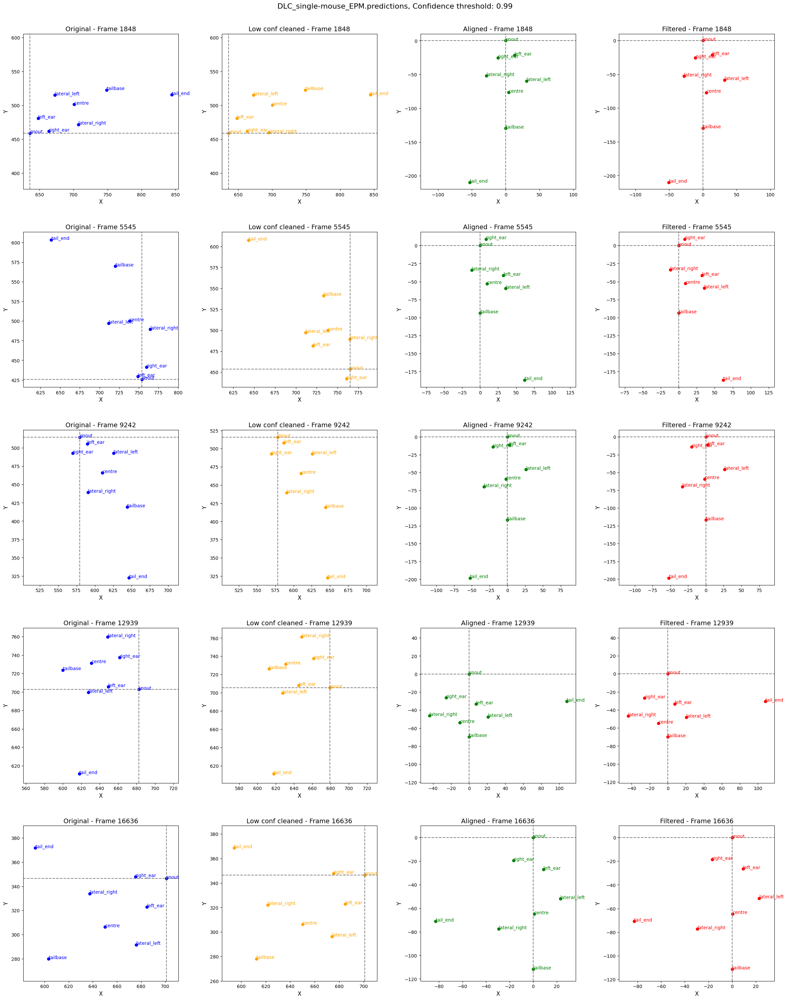

In [13]:
from vame.visualization import visualize_preprocessing_scatter

visualize_preprocessing_scatter(config=config_data)

2026-02-15 15:07:17.661 INFO  --- [MainThread] vame.visualization.preprocessing : 516 : Key 'position_scaled' not found in dataset.


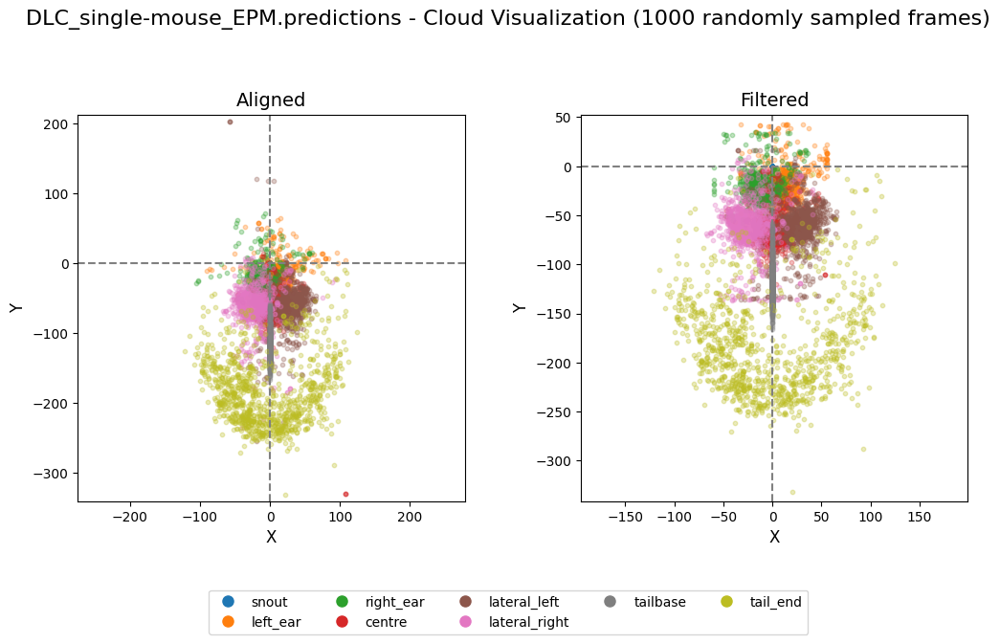

In [14]:
from vame.visualization import visualize_preprocessing_cloud

visualize_preprocessing_cloud(config=config_data)

2026-02-15 15:07:18.283 INFO  --- [MainThread] vame.visualization.preprocessing : 334 : Key 'position_scaled' not found in dataset.


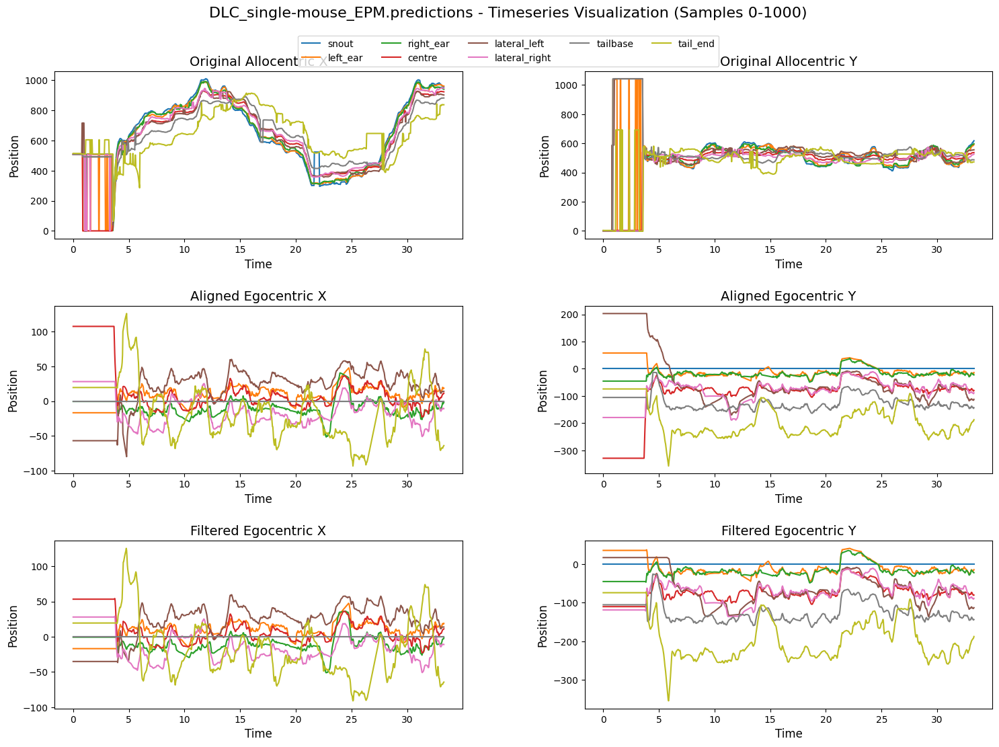

In [15]:
from vame.visualization import visualize_preprocessing_timeseries

visualize_preprocessing_timeseries(config=config_data)

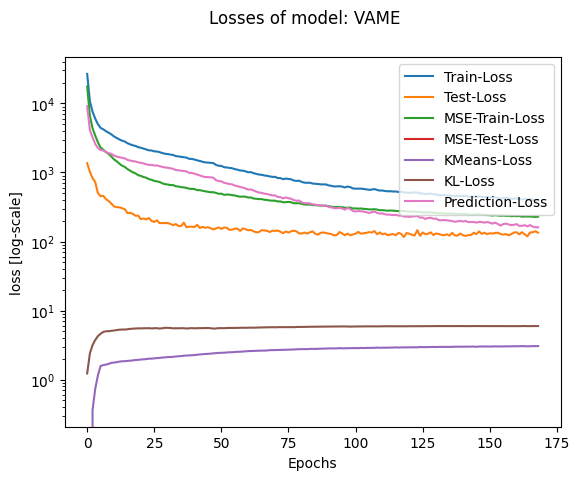

In [16]:
from vame.visualization import plot_loss

plot_loss(config=config_data)

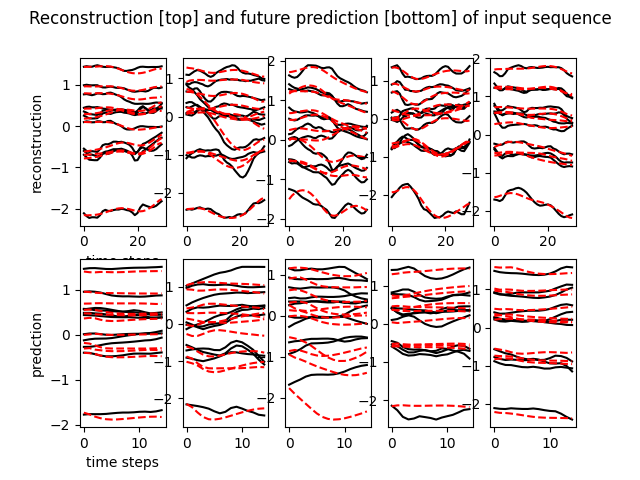

In [17]:
from IPython.display import Image, display

eval_plot_path = Path(config_data["project_path"]) / "model" / "evaluate" / "future_reconstruction.png"
display(Image(filename=eval_plot_path))

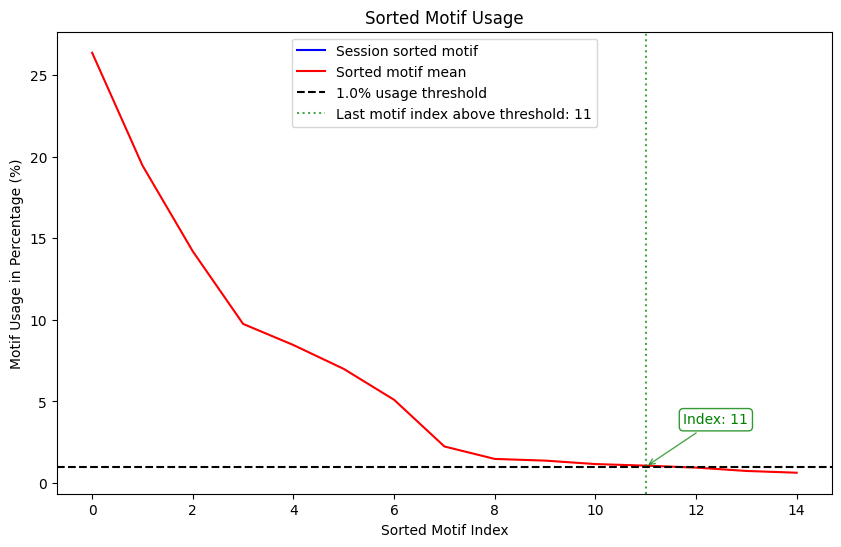

In [18]:
from vame.visualization import visualize_motif_thresholding

visualize_motif_thresholding(
    config=config_data,
    segmentation_algorithm="hmm",
    threshold=1.0,
)

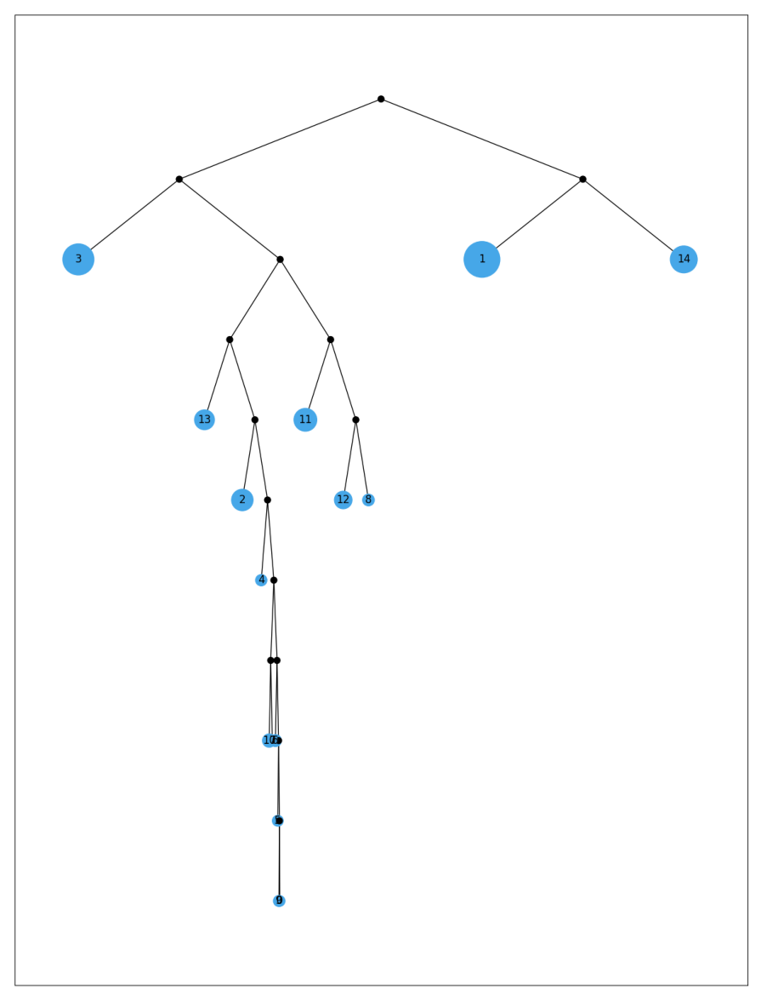

In [19]:
from vame.visualization import visualize_hierarchical_tree

visualize_hierarchical_tree(
    config=config_data,
    segmentation_algorithm="hmm",
)

In [20]:
## Uncomment  the lines below if you can't see the plotly figures in the Jupyter Notebook
# import plotly.io as pio
# pio.renderers.default = 'iframe'
from vame.visualization import visualize_umap

visualize_umap(
    config=config_data,
    show_figure="plotly",
)

2026-02-15 15:07:36.118 INFO  --- [MainThread] vame.visualization.umap : 682 : Computing UMAP embeddings for all sessions combined...
2026-02-15 15:07:36.135 INFO  --- [MainThread] vame.visualization.umap : 83 : Running UMAP calculation...
2026-02-15 15:07:36.143 | WARNING  | umap.umap_:_validate_parameters:1952 - c:\Users\zuria\miniconda3\envs\vame_research\Lib\site-packages\umap\umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(

2026-02-15 15:08:53.608 INFO  --- [MainThread] vame.visualization.umap : 191 : UMAP embeddings saved to C:\Users\zuria\Kaplan\VameTest\my_vame_project\results\umap_embedding.nc
2026-02-15 15:08:53.738 INFO  --- [MainThread] vame.visualization.umap : 780 : UMAP figure saved to C:\Users\zuria\Kaplan\VameTest\my_vame_project\reports\umap\umap_VAME_hmm-15.png
2026-02-15 15:08:54.119 INFO  --- [MainThread] vame.visualization.umap : 780 : UMAP figure saved to C:\Users\zuria\Kaplan\VameTest\my_va

2026-02-15 15:09:00.485 INFO  --- [MainThread] vame.visualization.umap : 821 : Interactive UMAP figure saved to C:\Users\zuria\Kaplan\VameTest\my_vame_project\reports\umap\umap_VAME_kmeans-15_interactive.html


In [22]:
from vame.video import add_videos_to_project

add_videos_to_project(config=config_data, videos=videos,copy_videos=True)

2026-02-15 15:11:21.417 INFO  --- [MainThread] vame.video.video : 66 : Copying C:\Users\zuria\.movement\data\videos\DLC_single-mouse_EPM.predictions.mp4 to C:\Users\zuria\Kaplan\VameTest\my_vame_project\data\raw\DLC_single-mouse_EPM.predictions.mp4


In [23]:
vame.motif_videos(config=config_data)

2026-02-15 15:11:23.728 INFO  --- [MainThread] vame.analysis.videowriter : 213 : Creating motif videos for session DLC_single-mouse_EPM.predictions, algorithm: hmm, n_clusters: 15
2026-02-15 15:11:23.729 INFO  --- [MainThread] vame.analysis.videowriter : 67 : Motif videos getting created for DLC_single-mouse_EPM.predictions ...
2026-02-15 15:11:23.840 INFO  --- [MainThread] vame.analysis.videowriter : 101 : Cluster: 0
2026-02-15 15:11:23.843 INFO  --- [MainThread] vame.analysis.videowriter : 83 : 0%|          | 0/137 [00:00<?, ?it/s]
2026-02-15 15:11:24.501 INFO  --- [MainThread] vame.analysis.videowriter : 83 : 1%|          | 1/137 [00:00<01:29,  1.52it/s]
2026-02-15 15:11:24.620 INFO  --- [MainThread] vame.analysis.videowriter : 83 : 1%|1         | 2/137 [00:00<00:46,  2.93it/s]
2026-02-15 15:11:24.746 INFO  --- [MainThread] vame.analysis.videowriter : 83 : 2%|2         | 3/137 [00:00<00:32,  4.12it/s]
2026-02-15 15:11:24.911 INFO  --- [MainThread] vame.analysis.videowriter : 83 : 3%

In [24]:
vame.community_videos(config=config_data)

2026-02-15 15:33:16.752 INFO  --- [MainThread] vame.analysis.videowriter : 304 : Creating community videos for session DLC_single-mouse_EPM.predictions, algorithm: hmm, n_clusters: 15
2026-02-15 15:33:16.753 INFO  --- [MainThread] vame.analysis.videowriter : 75 : Community videos getting created for DLC_single-mouse_EPM.predictions ...
2026-02-15 15:33:16.765 INFO  --- [MainThread] vame.analysis.videowriter : 101 : Cluster: 0
2026-02-15 15:33:16.766 INFO  --- [MainThread] vame.analysis.videowriter : 83 : 0%|          | 0/1000 [00:00<?, ?it/s]
2026-02-15 15:33:16.933 INFO  --- [MainThread] vame.analysis.videowriter : 83 : 0%|          | 1/1000 [00:00<02:44,  6.06it/s]
2026-02-15 15:33:17.54 INFO  --- [MainThread] vame.analysis.videowriter : 83 : 0%|          | 2/1000 [00:00<02:18,  7.19it/s]
2026-02-15 15:33:17.167 INFO  --- [MainThread] vame.analysis.videowriter : 83 : 0%|          | 3/1000 [00:00<02:06,  7.86it/s]
2026-02-15 15:33:17.282 INFO  --- [MainThread] vame.analysis.videowrite